Grupo: 
* Arthur Estevão
* Guilherme Giacomin
* Sílvia Fonseca
* Uriel Braga


Repositório: https://github.com/Arthuresm/Trabalho-Final-IA

## Proposta de trabalho
Este trabalho tem como objetivo, realizar um estudo sobre o mercado de filmes listados no IMDb.

O estudo consiste em possibilitar criar um modelo baseado nos algoritmos ***Decision Tree Classifier*** e ***Random Forest***. 

Ambos os algoritmos possuem um grau de assertividade normalmente alto para bases consideravelmente pequenas, o que não é o caso, visto que a quantidade de filmes e a diversificação entre eles é extremamente grande. Por conta disso a abordagem irá seguir avaliando quais características mais contribuem na geração de um bom modelo, na tentativa de criar um novo filme que pode ter uma nota satisfatória segundo a crítica.


In [2]:
#@markdown Temos 4 bases disponíveis (hospedadas no github) para realizar o estudo onde cada uma tem sua especificidade.

data_urls = {
    "movies": "https://github.com/Arthuresm/Trabalho-Final-IA/raw/main/Data/IMDb%20movies.zip",
    "names": "https://github.com/Arthuresm/Trabalho-Final-IA/raw/main/Data/IMDb%20names.zip",
    "ratings": "https://github.com/Arthuresm/Trabalho-Final-IA/raw/main/Data/IMDb%20ratings.zip",
    "titles": "https://github.com/Arthuresm/Trabalho-Final-IA/raw/main/Data/IMDb%20title_principals.zip"
}

In [3]:
import pandas as pd
import numpy as np

In [4]:
def get_data_frame_from_zip(url):
  return pd.read_csv(url, compression="zip")

In [5]:
dfs = {
    "movies": get_data_frame_from_zip(data_urls["movies"]),
    "names": get_data_frame_from_zip(data_urls["names"]),
    "ratings": get_data_frame_from_zip(data_urls["ratings"]),
    "titles": get_data_frame_from_zip(data_urls["titles"])
}

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2822: DtypeWarning:

Columns (3) have mixed types.Specify dtype option on import or set low_memory=False.



In [6]:
#@markdown Aqui podemos começar a visualizar quais as características de cada base.
dfs["movies"].head()

,imdb_title_id,title,original_title,year,date_published,genre,duration,country,language,director,writer,production_company,actors,description,avg_vote,votes,budget,usa_gross_income,worlwide_gross_income,metascore,reviews_from_users,reviews_from_critics
0,tt0000009,Miss Jerry,Miss Jerry,1894,1894-10-09,Romance,45,USA,None,Alexander Black,Alexander Black,Alexander Black Photoplays,"Blanche Bayliss, William Courtenay, Chauncey D...",The adventures of a female reporter in the 1890s.,5.9,154,NaN,NaN,NaN,NaN,1.0,2.0
1,tt0000574,The Story of the Kelly Gang,The Story of the Kelly Gang,1906,1906-12-26,"Biography, Crime, Drama",70,Australia,None,Charles Tait,Charles Tait,J. and N. Tait,"Elizabeth Tait, John Tait, Norman Campbell, Be...",True story of notorious Australian outlaw Ned ...,6.1,589,$ 2250,NaN,NaN,NaN,7.0,7.0
2,tt0001892,Den sorte drøm,Den sorte drøm,1911,1911-08-19,Drama,53,"Germany, Denmark",NaN,Urban Gad,"Urban Gad, Gebhard Schätzler-Perasini",Fotorama,"Asta Nielsen, Valdemar Psilander, Gunnar Helse...",Two men of high rank are both wooing the beaut...,5.8,188,NaN,NaN,NaN,NaN,5.0,2.0
3,tt0002101,Cleopatra,Cleopatra,1912,1912-11-13,"Drama, History",100,USA,English,Charles L. Gaskill,Victorien Sardou,Helen Gardner Picture Players,"Helen Gardner, Pearl Sindelar, Miss Fielding, ...",The fabled queen of Egypt's affair with Roman ...,5.2,446,$ 45000,NaN,NaN,NaN,25.0,3.0
4,tt0002130,L'Inferno,L'Inferno,1911,1911-03-06,"Adventure, Drama, Fantasy",68,Italy,Italian,"Francesco Bertolini, Adolfo Padovan",Dante Alighieri,Milano Film,"Salvatore Papa, Arturo Pirovano, Giuseppe de L...",Loosely adapted from Dante's Divine Comedy and...,7.0,2237,NaN,NaN,NaN,NaN,31.0,14.0


In [7]:
dfs["names"].head()

,imdb_name_id,name,birth_name,height,bio,birth_details,date_of_birth,place_of_birth,death_details,date_of_death,place_of_death,reason_of_death,spouses_string,spouses,divorces,spouses_with_children,children
0,nm0000001,Fred Astaire,Frederic Austerlitz Jr.,177.0,"Fred Astaire was born in Omaha, Nebraska, to J...","May 10, 1899 in Omaha, Nebraska, USA",1899-05-10,"Omaha, Nebraska, USA","June 22, 1987 in Los Angeles, California, USA ...",1987-06-22,"Los Angeles, California, USA",pneumonia,Robyn Smith (27 June 1980 - 22 June 1987) (hi...,2,0,1,2
1,nm0000002,Lauren Bacall,Betty Joan Perske,174.0,Lauren Bacall was born Betty Joan Perske on Se...,"September 16, 1924 in The Bronx, New York City...",1924-09-16,"The Bronx, New York City, New York, USA","August 12, 2014 in New York City, New York, US...",2014-08-12,"New York City, New York, USA",stroke,Jason Robards (4 July 1961 - 10 September 196...,2,1,2,3
2,nm0000003,Brigitte Bardot,Brigitte Bardot,166.0,"Brigitte Bardot was born on September 28, 1934...","September 28, 1934 in Paris, France",1934-09-28,"Paris, France",NaN,NaN,NaN,NaN,Bernard d'Ormale (16 August 1992 - present)\n...,4,3,1,1
3,nm0000004,John Belushi,John Adam Belushi,170.0,"John Belushi was born in Chicago, Illinois, US...","January 24, 1949 in Chicago, Illinois, USA",1949-01-24,"Chicago, Illinois, USA","March 5, 1982 in Hollywood, Los Angeles, Calif...",1982-03-05,"Hollywood, Los Angeles, California, USA",acute cocaine and heroin intoxication,Judith Belushi-Pisano (31 December 1976 - 5 M...,1,0,0,0
4,nm0000005,Ingmar Bergman,Ernst Ingmar Bergman,179.0,"Ernst Ingmar Bergman was born July 14, 1918, t...","July 14, 1918 in Uppsala, Uppsala län, Sweden",1918-07-14,"Uppsala, Uppsala län, Sweden","July 30, 2007 in Fårö, Gotlands län, Sweden (...",2007-07-30,"Fårö, Gotlands län, Sweden",natural causes,Ingrid Bergman (11 November 1971 - 20 May 199...,5,4,5,8


In [8]:
dfs["ratings"].head()

,imdb_title_id,weighted_average_vote,total_votes,mean_vote,median_vote,votes_10,votes_9,votes_8,votes_7,votes_6,votes_5,votes_4,votes_3,votes_2,votes_1,allgenders_0age_avg_vote,allgenders_0age_votes,allgenders_18age_avg_vote,allgenders_18age_votes,allgenders_30age_avg_vote,allgenders_30age_votes,allgenders_45age_avg_vote,allgenders_45age_votes,males_allages_avg_vote,males_allages_votes,males_0age_avg_vote,males_0age_votes,males_18age_avg_vote,males_18age_votes,males_30age_avg_vote,males_30age_votes,males_45age_avg_vote,males_45age_votes,females_allages_avg_vote,females_allages_votes,females_0age_avg_vote,females_0age_votes,females_18age_avg_vote,females_18age_votes,females_30age_avg_vote,females_30age_votes,females_45age_avg_vote,females_45age_votes,top1000_voters_rating,top1000_voters_votes,us_voters_rating,us_voters_votes,non_us_voters_rating,non_us_voters_votes
0,tt0000009,5.9,154,5.9,6.0,12,4,10,43,28,28,9,1,5,14,7.2,4.0,6.0,38.0,5.7,50.0,6.6,35.0,6.2,97.0,7.0,1.0,5.9,24.0,5.6,36.0,6.7,31.0,6.0,35.0,7.3,3.0,5.9,14.0,5.7,13.0,4.5,4.0,5.7,34.0,6.4,51.0,6.0,70.0
1,tt0000574,6.1,589,6.3,6.0,57,18,58,137,139,103,28,20,13,16,6.0,1.0,6.1,114.0,6.0,239.0,6.3,115.0,6.1,425.0,6.0,1.0,6.2,102.0,6.0,210.0,6.2,100.0,6.2,50.0,NaN,NaN,5.9,12.0,6.2,23.0,6.6,14.0,6.4,66.0,6.0,96.0,6.2,331.0
2,tt0001892,5.8,188,6.0,6.0,6,6,17,44,52,32,16,5,6,4,NaN,NaN,5.5,25.0,5.8,72.0,6.2,62.0,5.9,146.0,NaN,NaN,5.5,21.0,5.9,67.0,6.2,55.0,5.7,15.0,NaN,NaN,5.8,4.0,5.8,4.0,6.8,7.0,5.4,32.0,6.2,31.0,5.9,123.0
3,tt0002101,5.2,446,5.3,5.0,15,8,16,62,98,117,63,26,25,16,NaN,NaN,5.3,23.0,5.0,111.0,5.3,193.0,5.1,299.0,NaN,NaN,5.2,20.0,4.9,96.0,5.2,171.0,5.9,39.0,NaN,NaN,5.7,3.0,5.5,14.0,6.1,21.0,4.9,57.0,5.5,207.0,4.7,105.0
4,tt0002130,7.0,2237,6.9,7.0,210,225,436,641,344,169,66,39,20,87,7.5,4.0,7.0,402.0,7.0,895.0,7.1,482.0,7.0,1607.0,8.0,2.0,7.0,346.0,7.0,804.0,7.0,396.0,7.2,215.0,7.0,2.0,7.0,52.0,7.3,82.0,7.4,77.0,6.9,139.0,7.0,488.0,7.0,1166.0


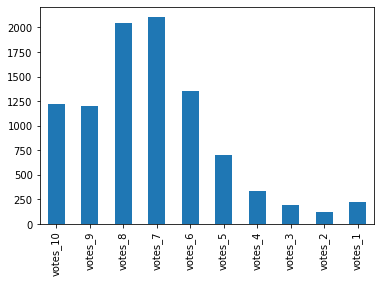

In [9]:
dfs["ratings"].mean(axis=0)[4:14].plot(kind="bar")

In [10]:
dfs["titles"].head()

,imdb_title_id,ordering,imdb_name_id,category,job,characters
0,tt0000009,1,nm0063086,actress,NaN,"[""Miss Geraldine Holbrook (Miss Jerry)""]"
1,tt0000009,2,nm0183823,actor,NaN,"[""Mr. Hamilton""]"
2,tt0000009,3,nm1309758,actor,NaN,"[""Chauncey Depew - the Director of the New Yor..."
3,tt0000009,4,nm0085156,director,NaN,NaN
4,tt0000574,1,nm0846887,actress,NaN,"[""Kate Kelly""]"


## Definindo a base que vamos trabalhar

Estudando as bases, podemos perceber que a primeira contém grandes informações sobre os filmes, como ano, gênero, país, língua, etc. Além disso, ela condensa a maior parte dos dados contidos nas outras 3 bases.

Dese modo, essa será utilizada.

In [11]:
#@markdown Definindo as características que serão trabalhadas
retricted_columns = dfs["movies"][["year", "genre", "country", "language", "director", "writer", "production_company", "actors", "avg_vote"]]

In [12]:
#@markdown Buscando por dados inválidos na coluna year
count = 0

invalid_values = []
for date in retricted_columns["year"]:
  if type(date) != int and len(date) != 4:
    invalid_values.append(count)
  count += 1
print(count)

85855


In [13]:
#@markdown O único dado inválido está na linha **83917**
invalid_values

[83917]

In [14]:
retricted_columns.loc[83917]

year                                                      TV Movie 2019
genre                                          Biography, Comedy, Crime
country                                                             USA
language                                                        English
director                                                    Cory Finley
writer                                     Mike Makowsky, Robert Kolker
production_company                                            HBO Films
actors                Hugh Jackman, Ray Romano, Welker White, Alliso...
avg_vote                                                            7.1
Name: 83917, dtype: object

In [15]:
#@markdown Optamos por removê-lo
retricted_columns.drop(83917, axis=0, inplace=True)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [16]:
#@markdown Transformando o tipo da coluna para dados numéricos
retricted_columns["year"] = pd.to_numeric(retricted_columns["year"])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



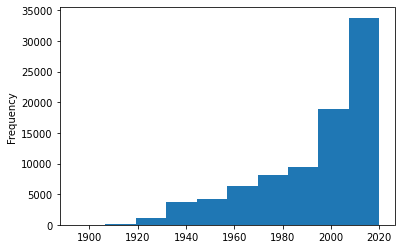

In [17]:
#@markdown Observando os filmes produzidos ao longo dos anos
retricted_columns["year"].plot(kind="hist")

Aqui realizamos uma decisão importante, onde os filmes que serão trabalhados foram lançados a partir de 1990. Isso foi feito pois filmes tem uma forte tendência temporal e uma quantidade significativa da base está descrita a partir desse ano.

In [18]:
retricted_columns = retricted_columns.sort_values(by=["year"], ascending=False)

In [19]:
retricted_columns = retricted_columns[retricted_columns["year"] >= 2010]

In [20]:
retricted_columns.reset_index(inplace=True)

In [21]:
retricted_columns.columns
retricted_columns.drop('index', axis=1, inplace=True)

In [22]:
#@markdown Se houver qualquer dado nulo na linha vamos removê-la
retricted_columns = retricted_columns.dropna(subset=["genre", "country", "language", "director", "writer", "production_company", "actors"], how="any")

In [23]:
#@markdown Número de filmes dentro de cada pontuação
retricted_columns["avg_vote"].value_counts()

6.4    1011
6.2     987
6.3     976
6.1     930
6.5     920
       ... 
9.2       3
9.8       2
9.7       2
9.4       1
9.5       1
Name: avg_vote, Length: 88, dtype: int64

In [24]:
#@markdown Média de pontuação por ano
retricted_columns.set_index("year").groupby(level="year").mean()

,avg_vote
year,
2010,5.641568
2011,5.640528
2012,5.642936
2013,5.633959
2014,5.676943
2015,5.648309
2016,5.695195
2017,5.728465
2018,5.710596


In [25]:
#@markdown Descrevendo a base atual. Um detalhe importante está no número de filmes (51886)
retricted_columns.describe()

,year,avg_vote
count,26487.000000,26487.000000
mean,2014.867369,5.681617
std,2.880509,1.300296
min,2010.000000,1.000000
25%,2012.000000,4.900000
50%,2015.000000,5.900000
75%,2017.000000,6.600000
max,2020.000000,9.800000


## Definindo as características trabalhadas

Os dados da base devem ser trabalhados para criarmos um modelo mais assertivo. Começaremos pela característica alvo, onde serão divididos intervalos para as notas serem classificadas.

In [26]:
# TERRIBLE = 1.0
# BAD = 2.0
# REGULAR = 3.0
# GREAT = 4.0
# EXCELLENT = 5.0

# TERRIBLE = "TERRIBLE"
BAD = "BAD"
REGULAR = "REGULAR"
GREAT = "GREAT"
# EXCELLENT = "EXCELLENT"


# retricted_columns['avg_vote_class'] = TERRIBLE

retricted_columns['avg_vote_class'] = BAD

# mask = (retricted_columns["avg_vote"] > 2) & (retricted_columns["avg_vote"] <= 4)
# retricted_columns.loc[mask, "avg_vote_class"] = BAD

mask = ((retricted_columns["avg_vote"] >= 5) & (retricted_columns["avg_vote"] <= 6))
retricted_columns.loc[mask, "avg_vote_class"] = REGULAR

mask = ((retricted_columns["avg_vote"] > 6) & (retricted_columns["avg_vote"] <= 10))
retricted_columns.loc[mask, "avg_vote_class"] = GREAT

# mask = (retricted_columns["avg_vote"] > 8)
# retricted_columns.loc[mask, "avg_vote_class"] = EXCELLENT

Diversas características apresentam um conjunto de possibilidades na base e com isso, vamos utilizar a técnica de One Hot Encoding para determinar em qual característica o filme se enquadra.

In [27]:
def sepate_data_by_comma(data):
  data_list = set()
  for e in data:
    i_begin = 0
    i_end = e.find(",", i_begin)
    while i_end != -1:
      data_list.add(e[i_begin:i_end:])
      i_begin = i_end + 2;
      i_end = e.find(",", i_begin)
    data_list.add(e[i_begin::])
  return data_list

In [28]:
def initialize_dict_with_valid_keys(valid_keys):
  result = {}
  for new_key in valid_keys:
    result[new_key] = []
  return result

In [29]:
def get_valid_keys(data, column_name):
  return sepate_data_by_comma(data[column_name])


def one_hot_encoding(df, column_name):
  valid_keys = get_valid_keys(df, column_name)

  result = initialize_dict_with_valid_keys(valid_keys)

  for index, row in df.iterrows():
    for key in valid_keys:
      result[key].append(1 if key in row[column_name] else 0) 

  return result

In [30]:
def add_columns(df, new_df_columns):
  for new_key in new_df_columns.keys():
    df[new_key] = new_df_columns[new_key]
  return df

In [31]:
def one_hot_column(df, column_name):
  values_column = get_valid_keys(df, column_name)
  print("Hot start Column: ", column_name)
  data = one_hot_encoding(df, column_name)
  df_with_values_encoded = pd.DataFrame(data, columns=values_column, index=df.index)
  df_result = df
  df_result = add_columns(df_result, df_with_values_encoded)
  return df_result

In [32]:
def one_hot_list(df, column_list):
  for column_name in column_list:
    df = one_hot_column(df, column_name)
  return df

In [33]:
retricted_columns.head()

,year,genre,country,language,director,writer,production_company,actors,avg_vote,avg_vote_class
1,2020,"Horror, Mystery","USA, Canada",English,Nicolas Pesce,"Nicolas Pesce, Nicolas Pesce",Screen Gems,"Tara Westwood, Junko Bailey, David Lawrence Br...",4.2,BAD
2,2020,"Action, Crime, Drama",USA,English,Prince Bagdasarian,Prince Bagdasarian,Imaginating Pictures,"Scout Taylor-Compton, Michael Urie, Najarra To...",4.2,BAD
3,2020,Drama,Italy,Italian,Francesco Amato,"Francesco Amato, Massimo Gaudioso",Lucky Red,"Vittoria Puccini, Benedetta Porcaroli, Edoardo...",6.7,GREAT
4,2020,Comedy,Italy,Italian,Giampaolo Morelli,"Gianluca Ansanelli, Giampaolo Morelli",Italian International Film,"Giampaolo Morelli, Serena Rossi, Diana Del Buf...",5.9,REGULAR
5,2020,"Action, Crime, Drama",USA,English,Steve Rahaman,Steve Rahaman,Rahaman Studios,"Daniel O'Shea, Debra Toscano, Michael Robert A...",4.5,BAD


Aqui, determinamos quais características serão avaliadas para o modelo de One Hot.

In [34]:
column_list = ["genre", "language"]

#"genre", "country", "language", "director", "writer", "production_company"

films_base = one_hot_list(retricted_columns, column_list)

Hot start Column:  genre
Hot start Column:  language


In [71]:
#@markdown Vamos visualizar as alterações realizadas.
films_base

,year,genre,country,language,director,writer,production_company,actors,avg_vote,avg_vote_class,Drama,Fantasy,Musical,War,Sci-Fi,Horror,Animation,Crime,Comedy,Biography,Adventure,News,Romance,Thriller,Action,Reality-TV,Mystery,Sport,Family,Music,History,Western,Kazakh,Micmac,Zulu,Middle English,Sioux,Sign Languages,Uzbek,Gallegan,...,Low German,Konkani,Shanghainese,Estonian,Quechua,Abkhazian,Nahuatl,Soninke,Hindi,Mirandese,Klingon,Dzongkha,Somali,Yiddish,Croatian,Tswana,Russian,Ladino,Flemish,Azerbaijani,Haida,German,Hokkien,Aymara,Dinka,English,Brazilian Sign Language,Old English,Hakka,Ibo,Marathi,Crimean Tatar,Mongolian,Malayalam,Malay,Korean,Bulgarian,French,Purepecha,Acholi
1,2020,"Horror, Mystery","USA, Canada",English,Nicolas Pesce,"Nicolas Pesce, Nicolas Pesce",Screen Gems,"Tara Westwood, Junko Bailey, David Lawrence Br...",4.2,BAD,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,2020,"Action, Crime, Drama",USA,English,Prince Bagdasarian,Prince Bagdasarian,Imaginating Pictures,"Scout Taylor-Compton, Michael Urie, Najarra To...",4.2,BAD,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,2020,Drama,Italy,Italian,Francesco Amato,"Francesco Amato, Massimo Gaudioso",Lucky Red,"Vittoria Puccini, Benedetta Porcaroli, Edoardo...",6.7,GREAT,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2020,Comedy,Italy,Italian,Giampaolo Morelli,"Gianluca Ansanelli, Giampaolo Morelli",Italian International Film,"Giampaolo Morelli, Serena Rossi, Diana Del Buf...",5.9,REGULAR,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,2020,"Action, Crime, Drama",USA,English,Steve Rahaman,Steve Rahaman,Rahaman Studios,"Daniel O'Shea, Debra Toscano, Michael Robert A...",4.5,BAD,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29318,2010,Drama,USA,English,Frank Pestarino,Frank Pestarino,"Broken, Beat & Scarred Productions","Jimmy Bennett, Zakk Wylde, Melissa Ordway, Jon...",6.7,GREAT,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
29319,2010,Comedy,UK,English,Steven Lawson,"Phillip Barron, Steven Lawson",Black & Blue Films,"Karen Anderson, Barry Austin, Alice Barry, Ste...",2.0,BAD,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
29320,2010,"Drama, Mystery, Thriller",India,Bengali,Anjan Dutt,"Saradindu Bandopadhyay, Anjan Dutt",Red Molecule,"Abir Chatterjee, Saswata Chatterjee, Arindol B...",7.4,GREAT,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
29321,2010,"Drama, Romance, Thriller","Poland, Sweden","English, Polish, Swedish",Agnieszka Lukasiak,Agnieszka Lukasiak,Hob,"Magdalena Poplawska, Simon Kassianides, Kamila...",6.7,GREAT,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [39]:
#@markdown Aqui temos a apresentação dos rótulos e sua proporção na base. É possível perceber que não temos nenhum rótulo se destacando dos demais, representando um bom balancemento para a base trabalhada.
import plotly.express as px

fig = px.histogram(films_base, x="avg_vote_class")
fig.show()

In [40]:
def get_columns_result():
  result = []
  for column_name in column_list:
    result += list(get_valid_keys(films_base, column_name))
  return result

In [41]:
columns = get_columns_result()

predictor = films_base.loc[:, columns].values
valid_class = films_base.iloc[:, 9].values

In [42]:
from sklearn.model_selection import train_test_split

predictor_training, predictor_test, class_training, class_test = train_test_split(predictor, valid_class, test_size=0.15, random_state=0)

## Utilizando um modelo de árvore de decisão

O exemplo a seguir utiliza o algoritmo de árvore de decisão e possui como medida de qualidade da divisão do nó, a entropia.

In [43]:
from sklearn.tree import DecisionTreeClassifier

classifier = DecisionTreeClassifier(criterion= 'entropy',
                                       random_state=0)
classifier.fit(predictor_training, class_training)
previsions = classifier.predict(predictor_test)

In [44]:
from sklearn.metrics import confusion_matrix, accuracy_score
precision = accuracy_score(class_test, previsions)
matrix = confusion_matrix(class_test, previsions)

A precisão e matriz de confusão são apresentadas em sequência.

In [45]:
precision

0.546804227478611

In [46]:
matrix

array([[ 601,  223,  167],
       [ 193, 1240,  343],
       [ 338,  537,  332]])

## Utilizando o algoritmo de Florestas aleatórias

Para utilizar o [Random Forest](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html), é necessário ter em mente o método de avaliação para o conjunto de testes.

Temos algumas opções a seguir, mas nem todas podem ser utilizadas, já que o problema em questão é [multiclasse](https://scikit-learn.org/stable/modules/multiclass.html) (temos filmes ruins, regulares e ótimos).

In [47]:
#@markdown Métricas e pontuações validas
import sklearn
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'roc_auc_ovo',
 'roc_auc_ovo_weighted',
 'roc_auc_ovr',
 'roc_auc_ovr_weighted',
 'v_measure_score']

Para nos auxiliar quanto aos hiperparâmetros que podem ser utilizados, vamos fazer uso do [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).

Este é um grande módulo que possibilita gerar combinações para os hiperparâmetros desejados.

In [69]:
#@markdown Tipos de score disponíveis em [Sckit Learning Metrics](https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter)
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = [
              {'n_estimators': [1, 2, 3, 4, 5], "max_depth": [5, 10, 15, 25], 'criterion': ["gini", "entropy"], "random_state": [42]},
              {'bootstrap': [False], 'n_estimators': [1, 2, 3, 4, 5], 'max_features': [2, 3, 4], 'criterion': ["gini", "entropy"], "max_depth": [5, 10, 15, 25], "random_state": [42]},
              {'n_estimators': [1, 10, 100, 200, 500, 1000], "max_depth": [5, 10], 'criterion': ["entropy"], "random_state": [42], "n_jobs": [2]},
]

random_forest = RandomForestClassifier()


Essa é a parte mais demorada, pois vamos executar todas as combinações possíveis para os hiperparâmtros definidos anteriormente.

O melhor modelo estará presente no fim da execução.

In [70]:
scoring_grid = ['f1_macro', 'f1_micro', 'precision_micro', 'recall_macro','recall_micro']
grid_search = None
best_grid = 0
for current_scoring in scoring_grid:
  print(current_scoring)
  current_grid_search = GridSearchCV(random_forest, param_grid, cv=5,   #Utilizando validacao cruzada de 5 partes
                           scoring=current_scoring)
  current_grid_search.fit(predictor, valid_class)
  if current_grid_search.best_score_ > best_grid:
    best_grid = current_grid_search.best_score_
    grid_search = current_grid_search

f1_macro
f1_micro
precision_micro
recall_macro
recall_micro


In [72]:
grid_search.cv_results_

{'mean_fit_time': array([ 0.07103457,  0.0826179 ,  0.09611807,  0.1118515 ,  0.12464309,
         0.07703328,  0.10036011,  0.11908927,  0.14215994,  0.16296988,
         0.08285885,  0.10806603,  0.13800569,  0.16167235,  0.19380512,
         0.09267774,  0.1284152 ,  0.16327252,  0.19784994,  0.23494725,
         0.06768699,  0.08313012,  0.09389257,  0.10843964,  0.12763977,
         0.07527099,  0.10034628,  0.11560631,  0.13436546,  0.15582991,
         0.08053713,  0.10706415,  0.13595209,  0.16284804,  0.18393192,
         0.09175963,  0.12725954,  0.16941199,  0.20192871,  0.23946834,
         0.06133318,  0.06802349,  0.07529836,  0.08111787,  0.08651562,
         0.0631474 ,  0.07044554,  0.07809982,  0.0861702 ,  0.09134412,
         0.0647696 ,  0.07216191,  0.08447433,  0.09056673,  0.09919968,
         0.06568327,  0.07449141,  0.08769937,  0.09482279,  0.10563407,
         0.0681704 ,  0.07832894,  0.09082322,  0.10144467,  0.11447024,
         0.06987972,  0.08369932, 

Esses foram os melhores parâmetros encontrados para o problema (dentre os definidos).

- criterion: Mede critério de divisão do nó.

- max_depth: Profundidade máxima das árvores.

- n_estimators: Número de árvores de decisão na floresta.

- random_state: Controla a aleatoriedade na geração de amostras.


In [90]:
grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 25,
 'n_estimators': 5,
 'random_state': 42}

In [74]:
grid_search.estimator

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [75]:
best_random_forest = grid_search.best_estimator_

print(best_random_forest)

tree_example = best_random_forest.estimators_[0]

print(tree_example)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=25, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=5,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)
DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=25, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1608637542, splitter='best')


Podemos perceber que o ganho não foi significativo pela demora no processo de validação e contrução do modelo.

Isso decorre da complexidade do problema trabalhado (as características utilizadas possivelmente não possuem uma forte correlação com a pontuação).

Outro fator que corrobora o resultado obtido é a forma com que o problema foi montado, talvez a utilização de todas as possibilidades de características para a língua e gênero do filme, não se adequa muito bem ao modelo utilizado e se faz necessário um algoritmo mais robusto.

In [76]:
print(grid_search.scorer_)
print(grid_search.best_score_)

make_scorer(f1_score, pos_label=None, average=micro)
0.5564992057656659


In [77]:
feature_importances = best_random_forest.feature_importances_
feature_importances

array([1.47987661e-01, 1.64202024e-02, 4.06180752e-03, 4.26170902e-03,
       1.51764544e-02, 1.04152385e-01, 1.79895784e-02, 2.24567583e-02,
       3.46404463e-02, 2.45318702e-02, 1.89122773e-02, 0.00000000e+00,
       2.41887887e-02, 3.90632786e-02, 3.34861697e-02, 9.37605707e-06,
       1.97033269e-02, 4.28115763e-03, 1.20432653e-02, 9.01132122e-03,
       9.43493850e-03, 1.93635018e-03, 9.81905700e-06, 8.69116820e-05,
       3.36941789e-04, 0.00000000e+00, 5.05703619e-05, 2.09987423e-04,
       7.89218625e-05, 2.78626185e-04, 8.81635101e-04, 0.00000000e+00,
       9.52768991e-05, 8.09578865e-06, 1.82920834e-04, 1.11703258e-04,
       1.84997240e-05, 0.00000000e+00, 3.42989675e-04, 4.81893506e-03,
       0.00000000e+00, 4.24241568e-04, 0.00000000e+00, 0.00000000e+00,
       4.74366663e-03, 2.77093852e-03, 0.00000000e+00, 1.80128614e-05,
       6.52222739e-05, 2.02249103e-04, 6.89906013e-05, 5.42251270e-03,
       8.56557320e-04, 4.67219882e-04, 3.30258923e-04, 3.20912682e-04,
      

Considerando a floresta como um todo, as características mais relevantes foram:

In [78]:
sorted(zip(feature_importances, columns), reverse=True)

[(0.14798766096978042, 'Drama'),
 (0.10502926017209316, 'English'),
 (0.10415238465891297, 'Horror'),
 (0.03906327857707234, 'Thriller'),
 (0.03464044630163017, 'Comedy'),
 (0.03348616973595417, 'Action'),
 (0.02453187022350976, 'Biography'),
 (0.024196499143797078, 'French'),
 (0.024188788659350945, 'Romance'),
 (0.022456758281791923, 'Crime'),
 (0.021482393219941536, 'Japanese'),
 (0.0197033268875947, 'Mystery'),
 (0.018912277304051518, 'Adventure'),
 (0.017989578424027493, 'Animation'),
 (0.017473383286798674, 'German'),
 (0.01642020237106777, 'Fantasy'),
 (0.016397329846310333, 'Spanish'),
 (0.01600220303230842, 'Russian'),
 (0.015176454376779414, 'Sci-Fi'),
 (0.012329974443377526, 'Italian'),
 (0.012292361503345148, 'Korean'),
 (0.012043265336096853, 'Family'),
 (0.011102978204168371, 'Hindi'),
 (0.010249646476291844, 'Turkish'),
 (0.00943493850137807, 'History'),
 (0.009359137960354832, 'Mandarin'),
 (0.00901132122241159, 'Music'),
 (0.008676467821784956, 'Arabic'),
 (0.007560281

A seguir iremos testar a aplicabilidade do modelo com o conjunto utilizado no exemplo de árvore de decisão. É importante ressaltar que esse teste não comprova a assetividade do modelo gerado. Exemplo de utilização do modelo

In [80]:
#@markdown Quantidade de elementos que serão testados por rótulo
from collections import Counter
Counter(class_test)

Counter({'BAD': 991, 'GREAT': 1776, 'REGULAR': 1207})

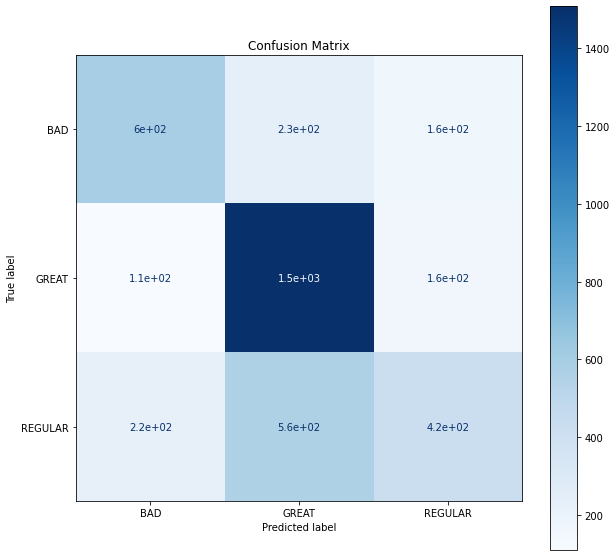

In [81]:
from sklearn.metrics import plot_confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))
ax.set_title("Confusion Matrix")

plot_confusion_matrix(best_random_forest, 
                      predictor_test,
                      class_test,
                      cmap=plt.cm.Blues,
                      ax=ax)
plt.show()

In [82]:
from sklearn.model_selection import cross_val_predict

y_scores = cross_val_predict(best_random_forest, 
                             predictor_test,
                             class_test,
                             cv = 5)

Uma outra possibilidade seria reduzir o escopo do problema, gerando um modelo capaz de classificar um filme como excelente ou não. Com isso teríamos um problema binário e uma boa métrica seria a [Curva ROC](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html), que possibilita avaliar classificadores desse tipo. (O caso a seguir é só um exemplo de utilização, para torná-lo um caso completo deveria ser gerada uma nova base e um novo modelo)

In [83]:
from sklearn.metrics import precision_score, recall_score, precision_recall_curve

precisions, recalls, thresholds = precision_recall_curve((class_test==GREAT), (y_scores==GREAT))

In [84]:
precisions

array([0.44690488, 0.58526786, 1.        ])

In [85]:
def plot_precision_recall_vs_threshold(precisions, recalls, thresholds):
  plt.plot(thresholds, precisions[:-1], "b--", label="Precision")
  plt.plot(thresholds, recalls[:-1], "g-", label="Recall")
  plt.xlabel("Threshold")
  plt.legend(loc="center left")
  plt.ylim([0, 1])

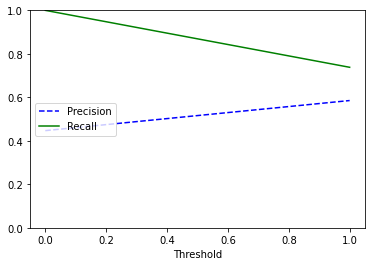

In [86]:
plot_precision_recall_vs_threshold(precisions, recalls, thresholds)
plt.show()

Visualizando uma das árvores geradas na floresta.

In [87]:
from sklearn import tree

fn=columns

cn=[BAD, REGULAR, GREAT]

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (8,8), dpi=1200)
tree.plot_tree(best_random_forest.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('rf_individualtree.png')

Percebendo algumas diferenças entre as árvores geradas.

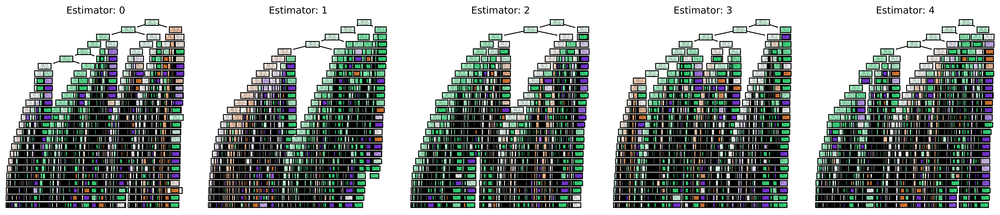

In [88]:
total_trees = grid_search.best_params_["n_estimators"]

if total_trees > 5:
  total_trees = 5

fig, axes = plt.subplots(nrows = 1,ncols = total_trees,figsize = (20,4), dpi=900)
for index in range(0, total_trees):
    tree.plot_tree(best_random_forest.estimators_[index],
                   feature_names = fn, 
                   class_names=cn,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('rf_5trees.png')

In [89]:
# from google.colab import files
# files.download("rf_individualtree.png")